# Data quality assessment Framework

## Availibility
1) Accessibility: data access portal? - easily made public? 

**SnowLive website - Norskpolarinstittutet database**

2) Timeliness: pulication at given time? regular updates? time interval (data+processing) meet requirements? 

**from April after installation? Hourly updates for locals. Daily for climate scientists. Explain reasons why station will not send data and thus limit updates: bug software, hardware failure, communication, low battery...**

*3) Authorisation: from PI to use data?* **NP-UiO. Licence CC-BY-NCC V3 - https://choosealicense.com/**

## Usability
1) Credibility: From specialised organisation? Experts regularly audit and check correctness of data content? Data exists in a range of known values 

**NP. Snow experts and maintainance. Need protocol for checking once a month? define range**

*2) Definition/Doc: data name, definition, ranges of valid values, standard format. Normative definition improve degree of data usage*

*3) Metadata: describe aspects of the datasets to reduce probems caused my misunderstanding or inconsistencies*
    
## Reliability
1) Accuracy: accurate? value reflects true state of source info? no ambiguity? 

**Independant validation = Station stake 6 or multiple temperature measurements on one station**

2) Consistency: data concept, value domain, format match before and after processing?, consistent over time? 

**logical relationship between correlated data is correct. Across stations**

3) Integrity: clear format? data consistent with structural/content integrity? 

**data.package->frame / database -> NetCDF. All characteristics must be correct**
     
4) Completeness: deficiency impact on use or accuracy/integrity of data? 

**If failure of wind sensor what will be affected (rimming). Maxbotics radiation internal temp. and lidar saturation**

## Relevance     
1) Fitness: data match the amount and theme users need? 

**enough sampling data (NAs) and for snow research. snow height, wind, lidar (see above)** 

## Presentation Quality
1) Readibility: Data are clear and understandable? description, classification and coding content satisfy specifications? **Data quality report**

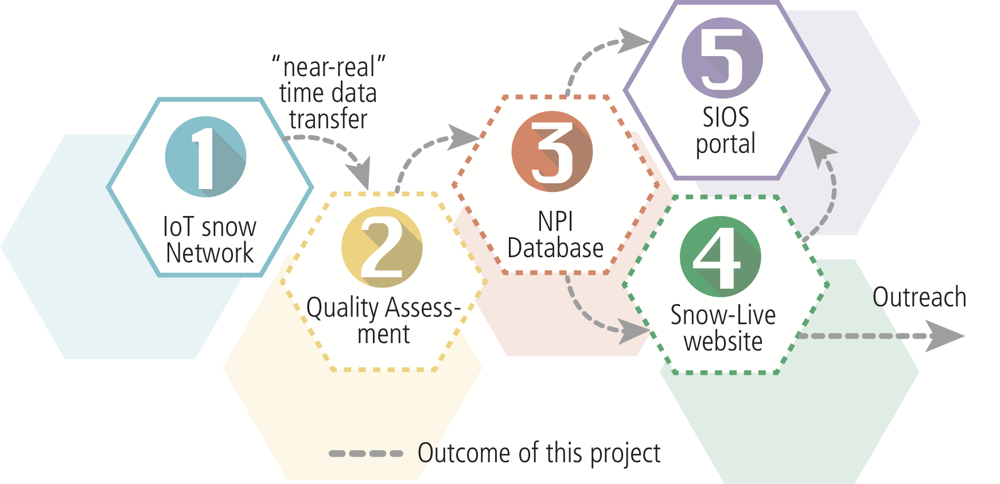

## Questions:
 

# Netcdf format conversion
If the time series instances have the same number of elements and the time values are identical for all instances, you may use the orthogonal multidimensional array representation.

In [39]:
dimensions:
     station = 10 ;  // measurement locations
     time = UNLIMITED ;
   variables:
     float humidity(station,time) ;
       humidity:standard_name = "specific humidity" ;
       humidity:coordinates = "lat lon alt" ;
     double time(time) ;
       time:standard_name = "time";
       time:long_name = "time of measurement" ;
       time:units = "days since 1970-01-01 00:00:00" ;
     float lon(station) ;
       lon:standard_name = "longitude";
       lon:long_name = "station longitude";
       lon:units = "degrees_east";
     float lat(station) ;
       lat:standard_name = "latitude";
       lat:long_name = "station latitude" ;
       lat:units = "degrees_north" ;
     float alt(station) ;
       alt:long_name = "vertical distance above the surface" ;
       alt:standard_name = "height" ;
       alt:units = "m";
       alt:positive = "up";
       alt:axis = "Z";
     char station_name(station, name_strlen) ;
       station_name:long_name = "station name" ;
       station_name:cf_role = "timeseries_id";
   attributes:
       :featureType = "timeSeries";

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 4)

In [ ]:
double time(station, obs) ;
          time:standard_name = "time";
          time:long_name = "time of measurement" ;
          time:units = "days since 1970-01-01 00:00:00" ;
          time:missing_value = -999.9;
      float humidity(station, obs) ;
          humidity:standard_name = “specific_humidity” ;
          humidity:coordinates = "time lat lon alt" ;
          humidity:_FillValue = -999.9;
      float temp(station, obs) ;
          temp:standard_name = “air_temperature” ;
          temp:units = "Celsius" ;
          temp:coordinates = "time lat lon alt" ;
          temp:_FillValue = -999.9;


# SnowLive Data - Ny Ålesund

This code downloads snow and weather data from WSN stations at Kongsvegen and Holtedalhfonna

## Station list

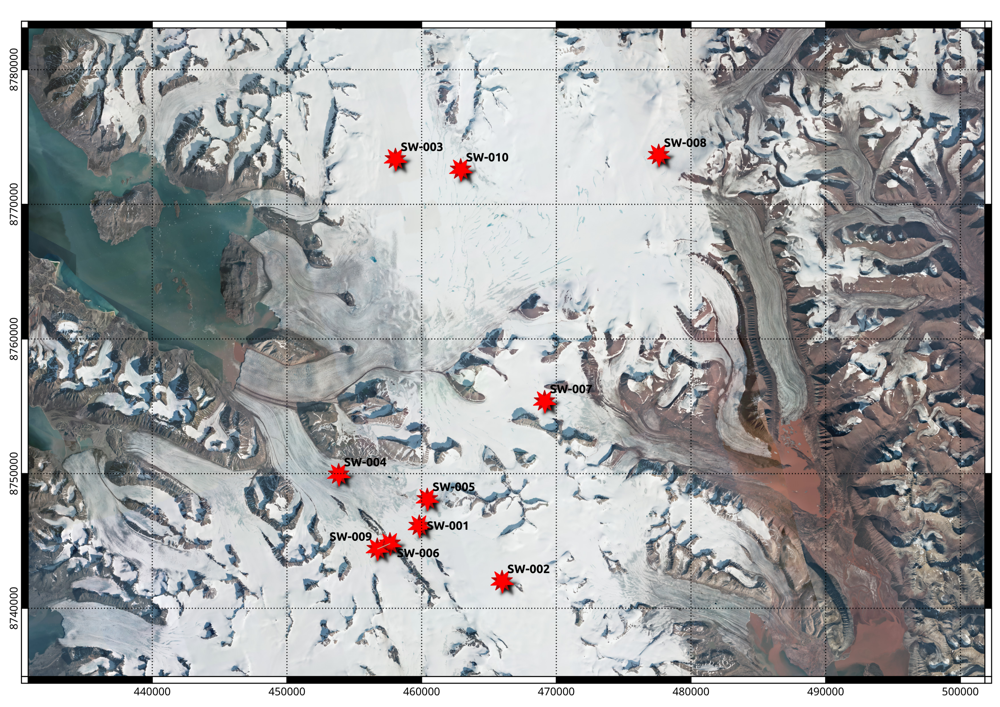

The wsn stations are the following:
- sw-001
    - status: in operation (in operation/errors/discontinued)
    - location: 78.7807, 13.150
    - serial: 8086522084101447316
    - period: 2019-04-07 - 2020-01-07
    - variables: {'type': 0, 'acc_x': 0.0, 'acc_y': 0.0, 'acc_z': 0.0, 'ds1820': [-8.3125, -8.375, -8.25, -8.375, -8.3125, -8.6875], 'mb_distance': [2723, 2718, 2720, 2721, 2721], 'vl_distance': [-18666], 'tmp_temperature': 248.3125}


- sw-002
    - status: in operation (in operation/errors/discontinued)
    - location: 78.745440, 13.437911
    - serial: 3820487337074744885
    - period: 2019-03-12 - 2020-02-27/2020-02-10
    - variables: {'type': 0, 'acc_x': -90.0, 'acc_y': -5.22, 'acc_z': -2.34, 'bme_tc': -13.11, 'ds1820': [-12.68, -15.43, -14.25, -12.12, -10.81, -9.18], 'int_tc': -13.05, 'bme_hum': 100.0, 'int_hum': 93.65, 'bme_pres': 89239.54, 'int_pres': 89106.89, 'mlx_object': -13.07, 'mlx_ambient': -13.36, 'vl_distance': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'tmp_temperature': -12.75}
    

 - sw-003
    - status: discontinued? (in operation/errors/discontinued)
    - location: 79.024036, 13.026258
    - serial: 3280141176863216682
    - period: 2019-04-09 - 2019-09-27
    - variables: {'type': 0, 'acc_x': -87.43, 'acc_y': -0.97, 'acc_z': 0.28, 'bme_tc': -4.57, 'ds1820': [-3.56, -3.5, -3.56, -3.68, -3.62, -0.75], 'int_tc': -2.91, 'wind_x': -1.9, 'wind_y': -0.7, 'bme_hum': 93.11, 'int_hum': 40.06, 'bme_pres': 92723.79, 'int_pres': 92850.55, 'wind_dir': 334.70, 'wind_gust': 8.84, 'wind_temp': -4.2, 'mlx_object': -4.64, 'wind_speed': 8.84, 'mlx_ambient': -4.35, 'vl_distance': [1986, 1936, 2981, 1287, 2218, 1558, 1025, 1749, 2704, 1579, 1558, 1932, 1767, 833, 1731], 'tmp_temperature': -3.9375}
    

 - sw-004
    - status: in operation (in operation/errors/discontinued)
    - location: 78.813033, 12.868199
    - serial: 6299991610825891336
    - period: 2019-02-18 - 2020-03-25/2020-01-13
    - variables: {'type': 0, 'acc_x': -78.52, 'acc_y': -0.22, 'acc_z': 6.89, 'bme_tc': -22.19, 'int_tc': -23.72, 'bme_hum': 100.0, 'int_hum': 56.69, 'bme_pres': 96201.78, 'int_pres': 96197.70, 'mlx_object': -31.44, 'mb_distance': [2393, 2391, 2396, 2396, 2392], 'mlx_ambient': -22.38, 'vl_distance': [2031, 2035, 2148, 2115, 2150], 'tmp_temperature': -20.75}


 - sw-006
    - status: errors? (in operation/errors/discontinued)
    - location: 78.768285, 13.051828
    - serial: 3977260103009558255
    - period: 2019-03-18 - 2019-04-05 // 2020-03-04 - 2020-03-21
    - variables: {'type': 0, 'acc_x': -90.0, 'acc_y': -2.34, 'acc_z': -1.89, 'bme_tc': -8.38, 'int_tc': -9.47, 'wind_x': -0.5, 'wind_y': -2.5, 'bme_hum': 100.0, 'int_hum': 29.85, 'bme_pres': 93174.29, 'int_pres': 93168.15, 'wind_dir': 180.0, 'wind_gust': 3.72, 'wind_temp': -8.7, 'mlx_object': -9.52, 'wind_speed': 3.72, 'mb_distance': [2365, 2349, 2354, 2357, 2347], 'mlx_ambient': -9.35, 'vl_distance': [2414, 2419, 2408, 2421, 2113], 'tmp_temperature': -8.56}


 - sw-009
    - status: in operation (in operation/errors/discontinued)
    - location: 78.764426, 13.009224
    - serial: 7297914994431120461
    - period: 2019-04-09 - 2020-04-08
    - variables: {'type': 0, 'acc_x': -90.0, 'acc_y': -0.85, 'acc_z': -0.91, 'bme_tc': -139.36, 'int_tc': -11.90, 'bme_hum': 69.09, 'int_hum': 24.91, 'bme_pres': 48861.52, 'int_pres': 94164.65, 'mlx_object': -21.92, 'mb_distance': [2015, 2032, 2532, 2529, 2531], 'mlx_ambient': -20.64, 'vl_distance': [106, 496, 380, 662, 655, 560, 202, 952, 136, 140, 335, 915, 660, 281, 1174], 'tmp_temperature': -20.18}
    

- sw-011 / sw-012 / sw-013
    - status: discontinued 
    - serial: {'imei': 300434063440280, 'device_type': 'ROCKBLOCK', 'device_serial': 15336} / {'imei': 300434063541170, 'device_type': 'ROCKBLOCK', 'device_serial': 15335} / 4574644594755523609
    
         
- sw-005 / sw-007 / sw-008 / sw-010 :
    - status: discontinued,  not on Django
    - location: 78.798641, 13.174380 / 78.865858, 13.567858 / 79.031324, 13.945341 / 79.018494, 13.255128
    


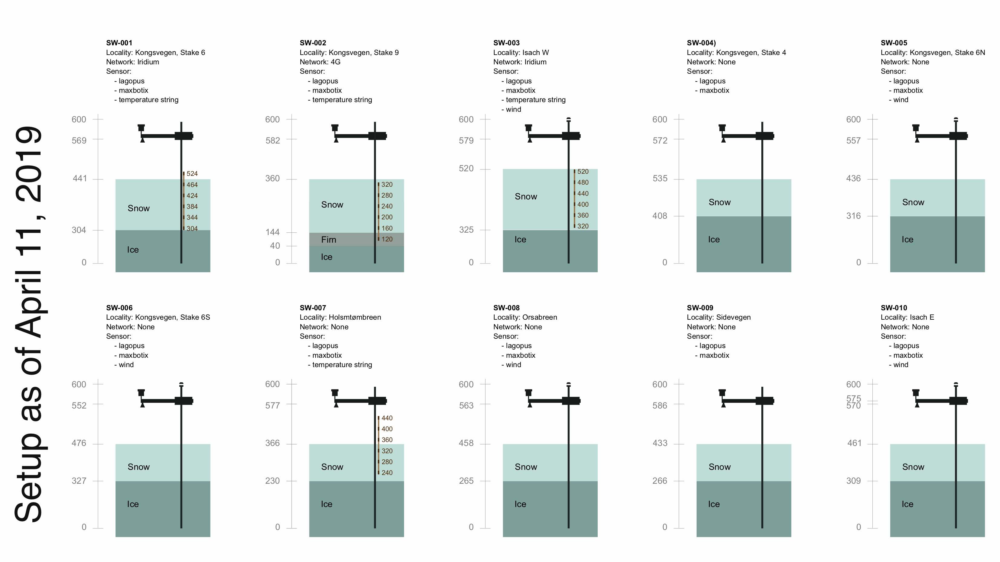

## Sensor description

Descriptions of each sensor on the Lagopus' plateform from UiO (version 1.0).

url: https://docs.latice.eu/Wireless_Weather_Station/Weather_Station_v1.html:

- Accelerometer 
    - variables:{'acc_x','acc_y','acc_z'}
    - sensor: accelerometer
    - placement: on the waspmote 
    - info: libellium's website.
    - url:
    - datasheet: 
        
        
- Humidity / temperature / atm. pressure
    - variables:{'bme_tc','int_tc','bme_hum','int_hum','bme_pres','int_pres'}
    - sensor: Humidity sensor **bme280** from Bosch
    - placement: outside {'bme_'} and inside the box {'int_'}
    - info: Bosch's webiste
    - url:https://www.bosch-sensortec.com/products/environmental-sensors/humidity-sensors-bme280/
    - datasheet: https://www.bosch-sensortec.com/media/boschsensortec/downloads/datasheets/bst-bme280-ds002.pdf
    
    
- Air temperature
    - variables:{'mlx_object','mlx_ambient'}
    - sensor: Infrared thermometer **MLX90614** from Sparkfun
    - placement: inside (ambient= internal temp.) and outside the box (object=surface skin temp.)
    - info: Sparkfun's website
    - url: https://www.sparkfun.com/products/9570
    - datasheet: https://www.sparkfun.com/datasheets/Sensors/Temperature/SEN-09570-datasheet-3901090614M005.pdf
    - note: difference in temperature is a proxy for solar radiation
    
    
- Air temperature
    - variables:{'tmp_temperature'}
    - sensor: Thermistor (high precision) **TMP117** from Sparkfun
    - placement: at the tip of lagopus circuit board 
    - info: Sparkfun's website
    - url: https://www.sparkfun.com/products/15805
    - datasheet: https://cdn.sparkfun.com/assets/9/e/5/1/8/tmp117.pdf
    
    
- Temperature at depth
    - variables:{'ds1820'} - array
    - sensor: Thermistors **ds18b20** from Maxim integrated
    - placement: at different depth attached to the structure pole (in the snow) 
    - info: Maxim integrated's website.
    - url: https://www.maximintegrated.com/en/products/sensors/DS18B20.html
    - datasheet: https://datasheets.maximintegrated.com/en/ds/DS18B20.pdf
 

- Wind speed
    - variables:{'wind_x','wind_y','win_dir','wind_gust','wind_temp'}
    - sensor: Anemometer **ATMOS 22** (formerly **DS-2**) from METER environment
    - placement: on the arm
    - info: METER group (formerly Decagon)'s website
    - url: https://www.metergroup.com/environment/products/atmos-22-sonic-anemometer/
    - datasheet: library.metergroup.com/Manuals/14586_DS2_Web.pdf
    - note: wind temp. is needed to get speed (correction)
   
   
- Distance to surface (laser)
    - variables:{'vl_distance'}
    - sensor: Infrared distance sensor **VL53L** from Sparkfun (VCSEL: Vertical Cavity Surface Emitting Laser)
    - placement: on the arm
    - info: Sparkfun's website.
    - url: https://www.sparkfun.com/products/14722
    - datasheet: https://cdn.sparkfun.com/assets/8/9/9/a/6/VL53L0X_DS.pdf


- Distance to surface (sonic ranger)
    - variables:{'mb_distance'} - array
    - sensor: Ultrasonic sensor **XXXX** from MaxBotix
    - placement: on the arm
    - info: MaxBotix's website.
    - url: https://www.maxbotix.com/Ultrasonic_Sensors.htm
    - datasheet: 
    - note: same measurements than vl but with a constant offset
    - unit: cm

## Data visualisation

In [1]:
from wsn_client import query
import datetime, os
from matplotlib import pyplot
import numpy as np
import pandas as pd

start = datetime.datetime(2019, 1, 1)
end = datetime.datetime(2020, 10, 10)

### - sw-001

In [2]:
# Load data
serial = 8086522084101447316
var_oi = ['tmp_temperature','bme_hum']
df = query.query('postgresql',fields=var_oi, serial=serial,
                      time__gte=start, time__lte=end, limit=2000000000000)
df.head()

/Users/pmlefeuv/miniconda3/envs/uioData/lib/python3.7/site-packages/wsn_client/query.py:228: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  data = pd.io.json.json_normalize(data['rows'])


,time,frame,type,bat,acc_x,acc_y,acc_z,bme_tc,int_tc,bme_hum,...,vl_distance,tmp_temperature,ds1820,altitude,latitude,longitude,gps_accuracy,gps_satellites,mlx_object,mlx_ambient
time,,,,,,,,,,,,,,,,,,,,,
2019-04-06 14:53:32,1554562412,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-04-06 15:00:00,1554562800,1,0,100.0,30.198678,1.203300,56.82467,22.82,24.559999,12.080078,...,"[811, 1066, 1376, 902, 1111]",22.6875,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-04-06 15:01:41,1554562901,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-04-06 15:10:00,1554563400,1,0,100.0,90.000000,8.221481,-1.03138,23.02,24.520000,11.994141,...,"[1404, 1436, 1364, 1571, 1570]",22.8750,"[24.1875, 24.0625, 24.5, 23.6875, 24.1875, 23....",NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-04-06 15:11:51,1554563511,0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


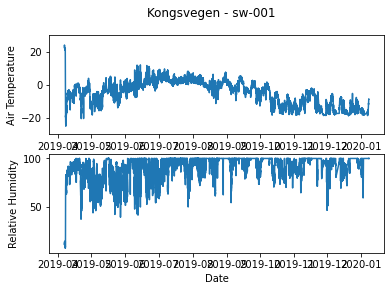

In [48]:
# Plot
fig, (ax1, ax2) = pyplot.subplots(2)
fig.suptitle('Kongsvegen - sw-001')
ax1.plot(df.tmp_temperature.loc[df.tmp_temperature<100])
ax1.set(xlabel="Date", ylabel="Air Temperature", ylim=(-30,30))
ax2.plot(df.bme_hum)
pyplot.xlabel("Date")
pyplot.ylabel("Relative Humidity")
pyplot.show()

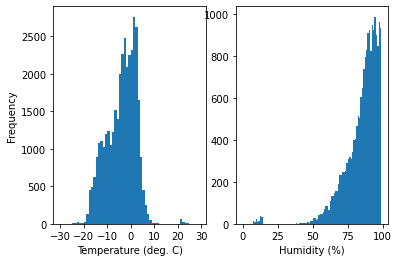

In [44]:
fig,(ax1,ax2) = pyplot.subplots(1,2)
ax1.hist(df.tmp_temperature, bins = np.arange(-30,30,1))
ax1.set(xticks=np.arange(-30,31,10),xlabel="Temperature (deg. C)",ylabel="Frequency")
ax2.hist(df.bme_hum, bins = np.arange(0,100,1))
ax2.set(xticks=np.arange(0,125,25),xlabel="Humidity (%)")
pyplot.show()

In [46]:
df.describe()

,time,tmp_temperature,bme_hum
count,3.586700e+04,35867.000000,35865.000000
mean,1.565494e+09,-3.939784,91.846197
std,6.477541e+06,6.500612,11.637072
min,1.554563e+09,-25.125000,6.622070
25%,1.559944e+09,-8.437500,87.115234
50%,1.565325e+09,-3.000000,97.215820
75%,1.570706e+09,0.937500,100.000000
max,1.578426e+09,248.312500,100.000000


Example temperature sensor TMP117:

Criteria for filtering - 
- out of range of the sensor defined by producer: –55°C to +150°C
- not a number data, defined by sensor: -99999
- 

In [3]:
from wsn_client import query
import datetime, os
from matplotlib import pyplot
import numpy as np
import pandas as pd

start = datetime.datetime(2019, 1, 1)
end = datetime.datetime(2020, 10, 10)
# Load data
#serial = 8086522084101447316
station_name =   [ f"sw-{x:03d}"  for x in range(1,14) ]
for name in station_name:
    var_oi = ['tmp_temperature','bme_hum'] #[]'type','acc_x','acc_y','acc_z','ds1820','mb_distance','vl_distance','tmp_temperature'
    df = query.query('postgresql', name=name, time__gte=start, time__lte=end, limit=2000000000000)
    # Remove non recorded data
    df = df[df.type==0]
    print(name)
    # Printing Number of columns and names
    print('Number of columns :', df.shape[1]) 
    print(df.columns)
    
    if df.empty: print("frame is empty")
    

sw-001
Number of columns : 29
Index(['time', 'frame', 'type', 'bat', 'acc_x', 'acc_y', 'acc_z', 'bme_tc',
       'int_tc', 'bme_hum', 'int_hum', 'bme_pres', 'int_pres', 'mb_distance',
       'vl_distance', 'tmp_temperature', 'ds1820', 'altitude', 'latitude',
       'longitude', 'gps_accuracy', 'gps_satellites', 'mlx_object',
       'mlx_ambient', 'received', 'momsn', 'iridium_cep', 'iridium_latitude',
       'iridium_longitude'],
      dtype='object')
sw-002
Number of columns : 21
Index(['time', 'frame', 'type', 'remote_addr', 'bat', 'acc_x', 'acc_y',
       'acc_z', 'bme_tc', 'int_tc', 'bme_hum', 'int_hum', 'bme_pres',
       'int_pres', 'vl_distance', 'tmp_temperature', 'mlx_object',
       'mlx_ambient', 'mb_distance', 'ds1820', 'received'],
      dtype='object')
sw-003
Number of columns : 30
Index(['time', 'frame', 'type', 'bat', 'acc_x', 'acc_y', 'acc_z', 'bme_tc',
       'ds1820', 'int_tc', 'wind_x', 'wind_y', 'bme_hum', 'int_hum',
       'bme_pres', 'int_pres', 'wind_dir', 'wind

## Select interesting columns

In [252]:
#dfnew = df[:,np.where(df.columns.isin(['tmp_temperature','bme_hum','bme_pres','mb_distance','wind_dir']))] #OLD
# Extract wanted and existing columns
coltoget = ['tmp_temperature','bme_tc','bme_hum','bme_pres','mb_distance','vl_distance','wind_dir','wind_gust','wind_speed']
coltoget2 = ['bme_tc','bme_hum', 'bme_pres', 'mlx_object','mb_distance', 'mlx_ambient', 'vl_distance', 'ds1820',
             'tmp_temperature','wind_dir', 'wind_gust', 'wind_speed','altitude', 'latitude', 'longitude']
df[df.columns[df.columns.isin(coltoget)]]

,bme_hum,bme_pres,mb_distance,tmp_temperature
time,,,,
2019-04-06 15:00:00,12.080078,103088.164062,"[2161, 2164, 2166, 2165, 2165]",22.6875
2019-04-06 15:10:00,11.994141,103092.312500,"[1203, 1200, 1201, 1207, 1210]",22.8750
2019-04-06 15:20:00,10.735352,103091.242188,"[1286, 1913, 1910, 1910, 1911]",23.4375
2019-04-06 15:30:00,11.067383,103101.437500,"[1236, 1247, 1234, 1247, 1237]",23.7500
2019-04-06 15:40:00,10.757812,103115.226562,"[1303, 1254, 1251, 1221, 1929]",23.9375
...,...,...,...,...
2020-01-07 19:00:00,100.000000,93323.742188,"[2666, 2661, 2652, 2653, 2652]",-8.6250
2020-01-07 19:10:00,100.000000,93313.500000,"[2703, 2678, 2680, 2710, 2679]",-8.6875
2020-01-07 19:20:00,100.000000,93264.695312,NaN,-8.5625


## Load one station and test post-processing

In [4]:
from wsn_client import query
import datetime, os
from matplotlib import pyplot
import numpy as np
import pandas as pd

start = datetime.datetime(2019, 1, 1)
end = datetime.datetime(2020, 10, 10)
# Load station
df = query.query('postgresql', name="sw-001", time__gte=start, time__lte=end, limit=2000000000000)
df = df[df.type==0]

In [5]:
print("NaN percentage per column")
for column in df: 
    if df[column].empty: print("column is empty")
    else: nanpercentage = df[column].isnull().sum()/len(df[column])*100
    print(df[column].name + ": \t" + f"{nanpercentage:.0f}%")  
    

NaN percentage per column
time: 	0%
frame: 	0%
type: 	0%
bat: 	0%
acc_x: 	0%
acc_y: 	0%
acc_z: 	0%
bme_tc: 	0%
int_tc: 	0%
bme_hum: 	0%
int_hum: 	0%
bme_pres: 	0%
int_pres: 	0%
mb_distance: 	8%
vl_distance: 	0%
tmp_temperature: 	0%
ds1820: 	0%
altitude: 	93%
latitude: 	93%
longitude: 	93%
gps_accuracy: 	93%
gps_satellites: 	93%
mlx_object: 	59%
mlx_ambient: 	59%
received: 	88%
momsn: 	88%
iridium_cep: 	88%
iridium_latitude: 	88%
iridium_longitude: 	88%


## Temperature

tmp_temp and bme_tc exists


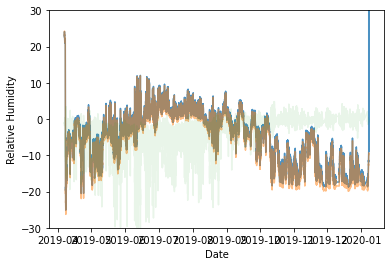

In [111]:
if sum(df.columns.isin(['tmp_temperature',"bme_tc"])) == 2:
    print("tmp_temp and bme_tc exists")
else:
    print("tmp_temp or bme_tc do not exist - skip")
#if 'tmp_temperature' in df.columns:
#    print("tmp_temp exists")    
#else:
#    print("tmp_temp do not exist skip")

# Plot temperature
pyplot.plot(df.tmp_temperature, alpha=0.8)
pyplot.plot(df.bme_tc, alpha=0.5)
pyplot.plot(df.bme_tc-df.int_tc, alpha=0.1)
pyplot.xlabel("Date")
pyplot.ylabel("Relative Humidity")
pyplot.ylim(-30,30)
pyplot.show()

[[1.        0.9999418]
 [0.9999418 1.       ]]
0.7399997711181641
count    41432.000000
mean         0.770096
std          0.181498
min         -0.312500
25%          0.632500
50%          0.740000
75%          0.902500
max          1.410000
dtype: float64


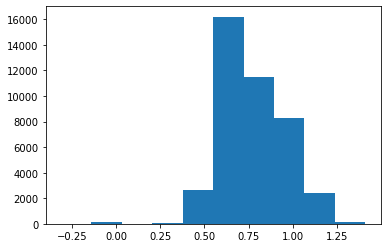

1.5569277067835567
0.6760448742325558


In [128]:
# Check correlation and bias temperatures (mean and std)
x=df.tmp_temperature
y=df.bme_tc
nan=~np.logical_or(np.isnan(x), np.isnan(y))
dxy = x[nan]-y[nan]
print(np.corrcoef(x[nan],y[nan]))
print(np.median(dxy))
print(dxy.describe())
pyplot.hist(dxy)
pyplot.show()
print(np.std(x-pd.Series(x).rolling("1H").mean()))
print(np.std(y-pd.Series(y).rolling("1H").mean()))

In [126]:
# Test Lag
from pandas.tseries.offsets import DateOffset
[x[nan].corr(y[nan].shift(freq=DateOffset(hours=lag))) for lag in range(24)]
[x[nan].corr(y[nan].shift(freq=DateOffset(minutes=lag))) for lag in range(120)]

[0.9999418046014402,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9930919655507429,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9898640924749705,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9874160907721848,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9851335696274013,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9834340077139423,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.981557907077321,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9801378011603286,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.978714040252925,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9769918555094481,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9751771795322642,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.9731789936035351,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan]

In [189]:
# Define threshold
x = x[x<30]
# Define installation periods to remove
x[x.index>pd.to_datetime("2019-04-07 13:50:00")] = np.nan
# Hourly rounding !centred!.
x.groupby(by=x.index.round('1H')).agg(['mean', 'std','count'])

,mean,std,count
time,,,
2019-04-06 15:00:00,23.000000,0.390312,3
2019-04-06 16:00:00,24.008929,0.132231,7
2019-04-06 17:00:00,23.864583,0.083073,6
2019-04-06 18:00:00,23.151786,0.286086,7
2019-04-06 19:00:00,22.550000,0.092702,5
...,...,...,...
2020-01-07 16:00:00,NaN,NaN,0
2020-01-07 17:00:00,NaN,NaN,0
2020-01-07 18:00:00,NaN,NaN,0


In [218]:
print(x.head(30))
x[~x.duplicated()]

time
2019-04-07 14:20:00   -18.8125
2019-04-07 14:30:00   -18.0625
2019-04-07 14:40:00   -17.7500
2019-04-07 14:50:00   -17.8125
2019-04-07 15:00:00   -18.2500
2019-04-07 15:10:00   -19.0000
2019-04-07 15:20:00   -18.9375
2019-04-07 15:30:00   -19.5625
2019-04-07 15:40:00   -18.8750
2019-04-07 15:50:00   -18.8750
2019-04-07 16:00:00   -18.1875
2019-04-07 16:10:00   -19.7500
2019-04-07 16:10:00   -19.7500
2019-04-07 16:20:00   -19.4375
2019-04-07 16:30:00   -18.7500
2019-04-07 16:40:00   -19.6875
2019-04-07 16:50:00   -18.6875
2019-04-07 17:00:00   -18.8750
2019-04-07 17:10:00   -21.5000
2019-04-07 17:20:00   -21.3750
2019-04-07 17:30:00   -22.0000
2019-04-07 17:40:00   -21.8125
2019-04-07 17:50:00   -22.0000
2019-04-07 18:00:00   -21.3125
2019-04-07 18:10:00   -21.9375
2019-04-07 18:10:00   -21.9375
2019-04-07 18:20:00   -22.0000
2019-04-07 18:30:00   -22.7500
2019-04-07 18:40:00   -23.9375
2019-04-07 18:50:00   -23.0625
Name: tmp_temperature, dtype: float64


time
2019-04-07 14:20:00   -18.8125
2019-04-07 14:30:00   -18.0625
2019-04-07 14:40:00   -17.7500
2019-04-07 14:50:00   -17.8125
2019-04-07 15:00:00   -18.2500
                        ...   
2019-07-02 06:50:00     6.6875
2019-07-06 11:00:00     9.6250
2019-10-12 22:50:00   -15.8125
2019-11-27 18:00:00   -18.3750
2019-11-27 21:00:00   -18.5625
Name: tmp_temperature, Length: 513, dtype: float64

## Result Temperature
Over an entire year, 'tmp_temperature' and "bme_tc":
- are correlated at 0.9999
- are constantly biased by 0.74 +-0.18 degrees celsius for bme_tc (lower than tmp_temp) in a normal distribution
- are not lagging one another (maybe due to the coarse time interval of 10 minutes)
- have a residual noise below the hour of 1.56 and 0.68 degrees celsius, respectively


In [47]:
# Test string generation
id=np.ind(np.arange(1,13))
a="sw-%1,2f" + num for num in id 
f"{x:03d}" for x in range(10) #"sw-" + range(10).map(str)

SyntaxError: invalid syntax (<ipython-input-47-b3bdb30cdbd4>, line 2)

# Snow depth

In [191]:
#df.mb_distance[df.mb_distance>4000 or df.mb_distance<1500]
d1 = df.mb_distance.apply(lambda x: np.median(np.array(x)))
std1 = df.mb_distance.apply(lambda x: np.std(np.array(x)))
d2 = df.vl_distance.apply(lambda x: np.median(np.array(x)))
std2 = df.vl_distance.apply(lambda x: np.std(np.array(x)))
d2d = d2.groupby(by=d2.index.round('1D')).agg(['max','mean', 'std','count'])
d1[d1<-100]=np.nan
d2[d2<-100]=np.nan
#d2[d2<600]=np.nan

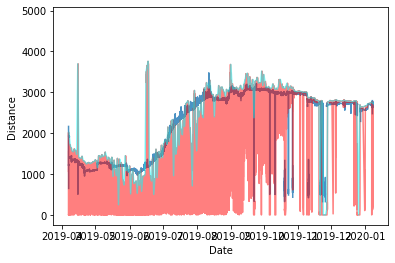

/Users/pmlefeuv/miniconda3/envs/uioData/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/pmlefeuv/miniconda3/envs/uioData/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


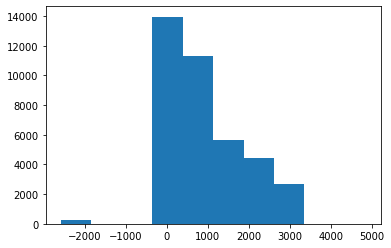

In [195]:
dnan=~np.logical_or(np.isnan(d1), np.isnan(d2))
dd = d1[nan]-d2[nan]
# Plot
pyplot.plot(d1, alpha=0.8)
pyplot.plot(d2, alpha=0.5,color="red")
pyplot.plot(d2d['max'], alpha=0.5,color="cyan")
pyplot.xlabel("Date")
pyplot.ylabel("Distance")
pyplot.show()

pyplot.hist(dd)
pyplot.show()

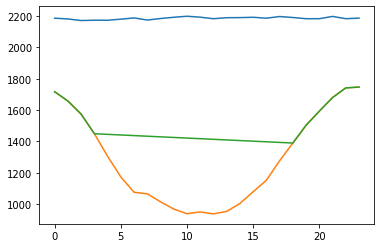

In [181]:
d1h = d1.groupby(d1.index.hour).mean()
d2h = d2.groupby(d2.index.hour).mean()
d2b = d2[(d2.index.hour<=3) + (d2.index.hour>=18)]
d2bh = d2b.groupby(d2b.index.hour).mean()
pyplot.plot(d1h)
pyplot.plot(d2h)
pyplot.plot(d2bh)

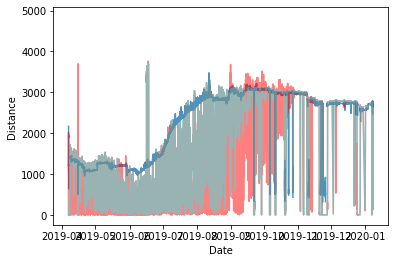

In [187]:
# Plot
pyplot.plot(d1, alpha=0.8)
pyplot.plot(d2, alpha=0.5,color="red")
pyplot.plot(d2b, alpha=0.4,color="cyan")
pyplot.xlabel("Date")
pyplot.ylabel("Distance")
pyplot.show()

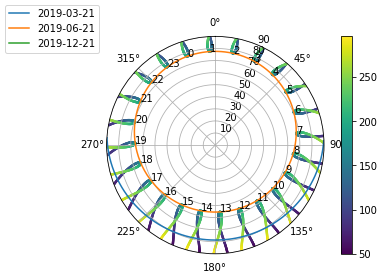

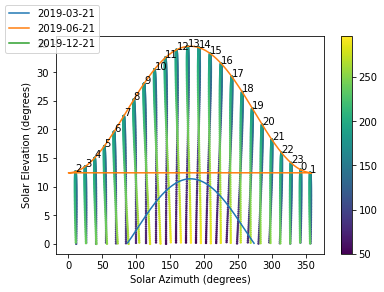

In [216]:
# Estimate sun height above ground 
from pvlib import solarposition
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

tz = 'CET'
lat, lon = 78.92,11.93

times = pd.date_range('2019-01-01 00:00:00', '2020-01-01', closed='left',
                      freq='H', tz=tz)
solpos = solarposition.get_solarposition(times, lat, lon)
# remove nighttime
solpos = solpos.loc[solpos['apparent_elevation'] > 0, :]

ax = plt.subplot(1, 1, 1, projection='polar')
# draw the analemma loops
points = ax.scatter(np.radians(solpos.azimuth), solpos.apparent_zenith,
                    s=2, label=None, c=solpos.index.dayofyear)
ax.figure.colorbar(points)

# draw hour labels
for hour in np.unique(solpos.index.hour):
    # choose label position by the smallest radius for each hour
    subset = solpos.loc[solpos.index.hour == hour, :]
    r = subset.apparent_zenith
    pos = solpos.loc[r.idxmin(), :]
    ax.text(np.radians(pos['azimuth']), pos['apparent_zenith'], str(hour))

# draw individual days
for date in pd.to_datetime(['2019-03-21', '2019-06-21', '2019-12-21']):
    times = pd.date_range(date, date+pd.Timedelta('24h'), freq='5min', tz=tz)
    solpos = solarposition.get_solarposition(times, lat, lon)
    solpos = solpos.loc[solpos['apparent_elevation'] > 0, :]
    label = date.strftime('%Y-%m-%d')
    ax.plot(np.radians(solpos.azimuth), solpos.apparent_zenith, label=label)

ax.figure.legend(loc='upper left')

# change coordinates to be like a compass
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_rmax(90)

plt.show()



times = pd.date_range('2019-01-01 00:00:00', '2020-01-01', closed='left',
                      freq='H', tz=tz)

solpos = solarposition.get_solarposition(times, lat, lon)
# remove nighttime
solpos = solpos.loc[solpos['apparent_elevation'] > 0, :]

fig, ax = plt.subplots()
points = ax.scatter(solpos.azimuth, solpos.apparent_elevation, s=2,
                    c=solpos.index.dayofyear, label=None)
fig.colorbar(points)

for hour in np.unique(solpos.index.hour):
    # choose label position by the largest elevation for each hour
    subset = solpos.loc[solpos.index.hour == hour, :]
    height = subset.apparent_elevation
    pos = solpos.loc[height.idxmax(), :]
    ax.text(pos['azimuth'], pos['apparent_elevation'], str(hour))

for date in pd.to_datetime(['2019-03-21', '2019-06-21', '2019-12-21']):
    times = pd.date_range(date, date+pd.Timedelta('24h'), freq='5min', tz=tz)
    solpos = solarposition.get_solarposition(times, lat, lon)
    solpos = solpos.loc[solpos['apparent_elevation'] > 0, :]
    label = date.strftime('%Y-%m-%d')
    ax.plot(solpos.azimuth, solpos.apparent_elevation, label=label)

ax.figure.legend(loc='upper left')
ax.set_xlabel('Solar Azimuth (degrees)')
ax.set_ylabel('Solar Elevation (degrees)')

plt.show()

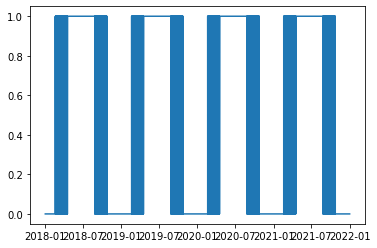

In [218]:
# Make mask
times = pd.date_range('2018-01-01', '2022-01-01', closed='left',freq='H', tz='CET')
solmask = solarposition.get_solarposition(times, lat=78.92, lon=11.93).apparent_elevation>0
pyplot.plot(solmask)

## MERGING:
Temperature (near surface), Humidity, Snow Depth pressure

# Output - Land Surface
## Temperature (near surface) 	
    TA - Temperature - one-minute average - degrees celsius - 12 101 +
## Snow
    SA - current total depth value from ice/ground in centimetre - 13 013 (SD - coverage - 20 062) (SA=0 indicates < 0,5 cm, SA=-1 bare but there can be snow patches in area , SA=-3 Not possible measurements.) 
    TSM Snøtemperatur timemiddel, °C
## Surface Wind Speed and direction
    DD - Surface wind direction - vector in degrees - 11 001 (DG - gust - 11 043 +) 
    FF - Surface wind speed - max 3 sec gust before main obs. in meter per second - 11 002 + (FG - gust - 11 041 +)
## Water Vapour (surface) 
    UU - Relative humidity - percentage - current (UM - hourly average)

## Others
### Pressure (surface)
    PO - Pressure at station's level - one-minute average - hectoPascal - 10 004
### Surface Radiation Budget 	
    QLI - Longwave incoming - watt per square metre - 14 002 +
    QLO - Longwave outgoing - watt per square metre - 14 002 +
    QSI - Shortwave incoming - watt per square metre - 14 021 +
    QSO - Shortwave outgoing - watt per square metre - 14 021 +
    QA - Albedo - QR/QO
### Precipitation (liquid and solid)
    RR_H - Precipitation in millimetre - cumulative sum (tilvekst) - 13 011 + (RR=0 not measureable precipitation, RR_x=-1 dry/no precip. ) 

Table:
time, TA, fTA, SA, fSA, DD, fDD, FF, fFF, UU, FUU, PO, fPO